In [1]:
# IMPORTS
import cvxpy as cp
import numpy as np
import numpy.linalg
import numpy.matlib
from numpy.linalg import norm
import algorithms.tikhonov_diff as tikhonov_diff
from scipy import interpolate
from scipy import signal
import csv   
import matplotlib.pyplot as plt
import pandas as pd

State: 1 | Realization: 0
State: 1 | Realization: 1
State: 1 | Realization: 2
State: 1 | Realization: 3
State: 1 | Realization: 4
State: 1 | Realization: 5
State: 1 | Realization: 6
State: 1 | Realization: 7
State: 1 | Realization: 8
State: 1 | Realization: 9
State: 1 | Realization: 10
State: 1 | Realization: 11
State: 1 | Realization: 12
State: 1 | Realization: 13
State: 1 | Realization: 14
State: 1 | Realization: 15
State: 1 | Realization: 16
State: 1 | Realization: 17
State: 1 | Realization: 18


/home/alexandre/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


State: 1 | Realization: 19
State: 1 | Realization: 20
State: 1 | Realization: 21
State: 1 | Realization: 22
State: 1 | Realization: 23
State: 1 | Realization: 24
State: 1 | Realization: 25
State: 1 | Realization: 26
State: 1 | Realization: 27
State: 1 | Realization: 28
State: 1 | Realization: 29
State: 1 | Realization: 30
State: 1 | Realization: 31
State: 1 | Realization: 32
State: 1 | Realization: 33
State: 1 | Realization: 34
State: 1 | Realization: 35
State: 1 | Realization: 36
State: 1 | Realization: 37
State: 1 | Realization: 38
State: 1 | Realization: 39
State: 1 | Realization: 40
State: 1 | Realization: 41
State: 1 | Realization: 42
State: 1 | Realization: 43
State: 1 | Realization: 44
State: 1 | Realization: 45
State: 1 | Realization: 46
State: 1 | Realization: 47
State: 1 | Realization: 48
State: 1 | Realization: 49
State: 1 | Realization: 50
State: 1 | Realization: 51
State: 1 | Realization: 52
State: 1 | Realization: 53
State: 1 | Realization: 54
State: 1 | Realization: 55
S

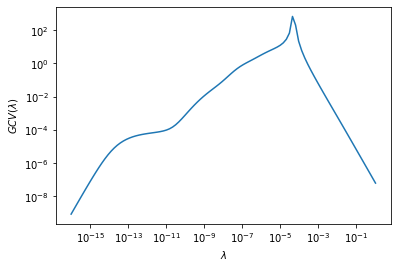

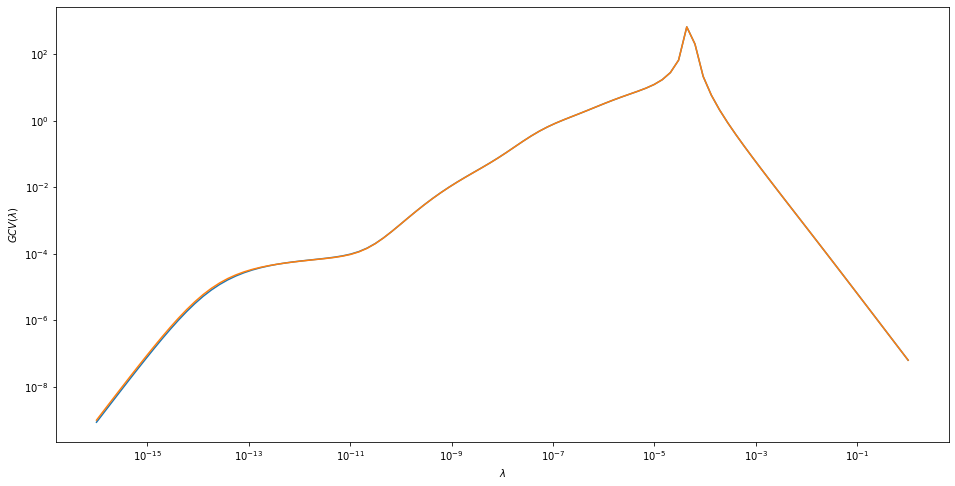

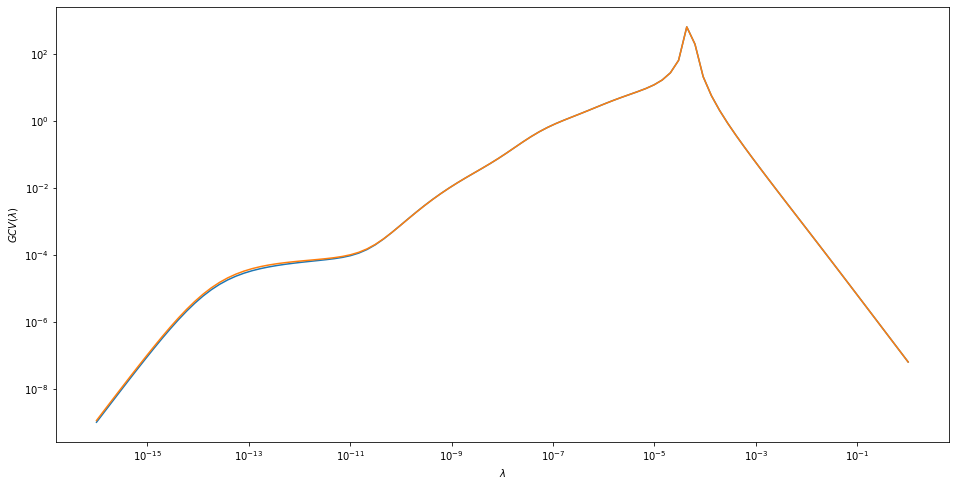

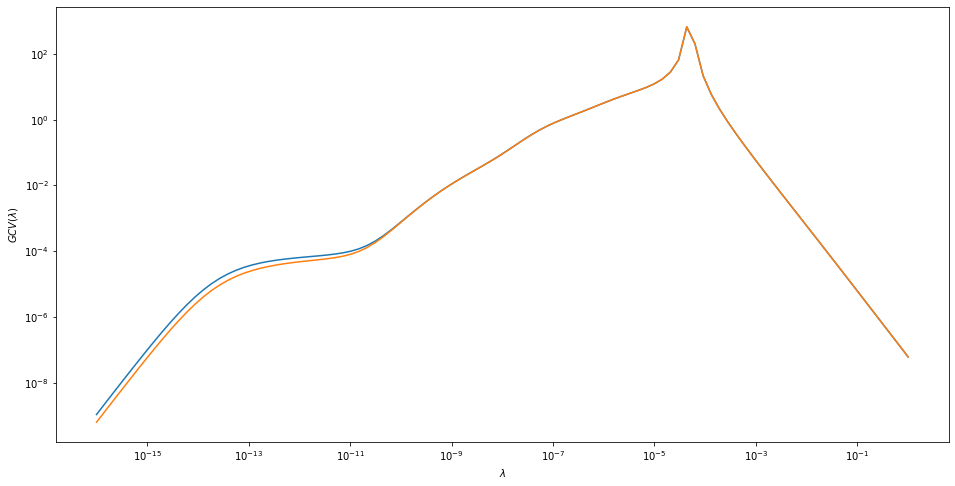

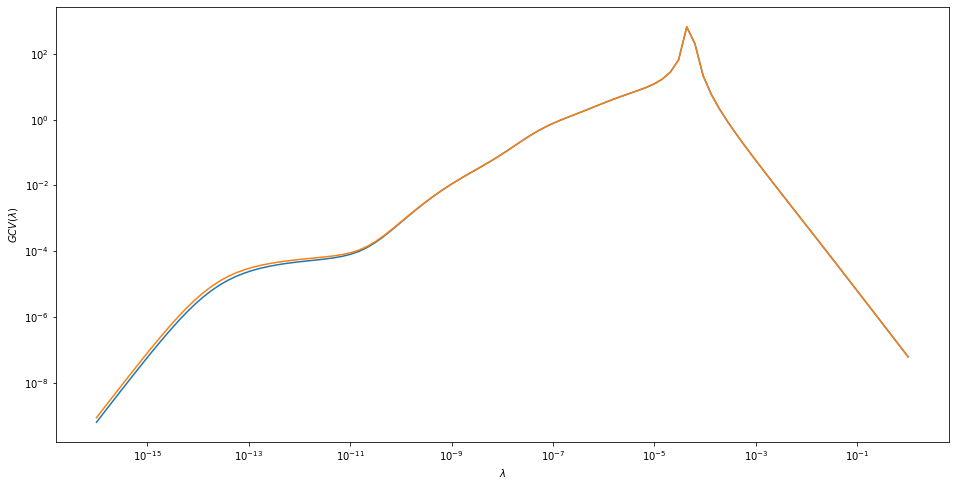

...

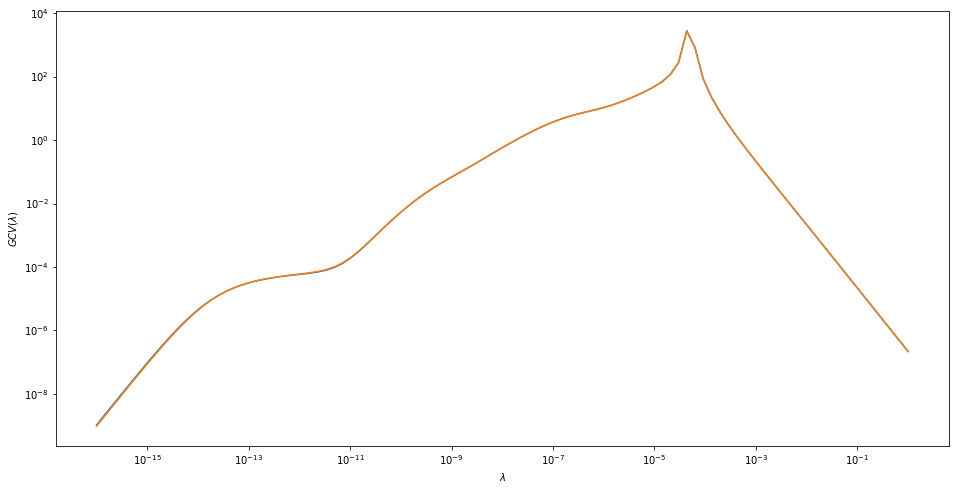

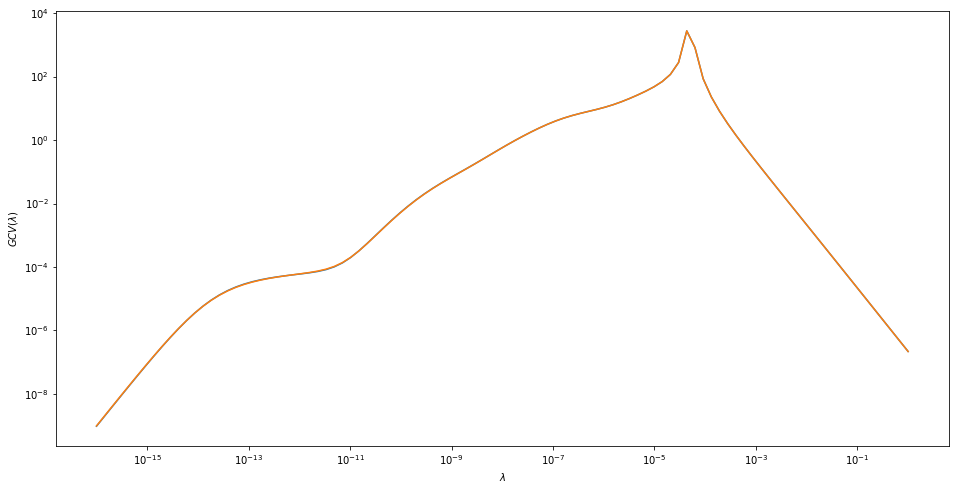

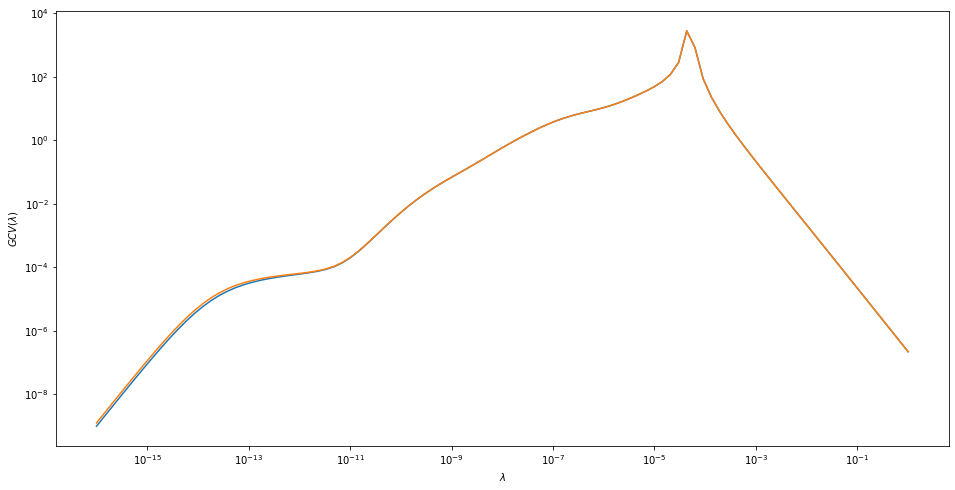

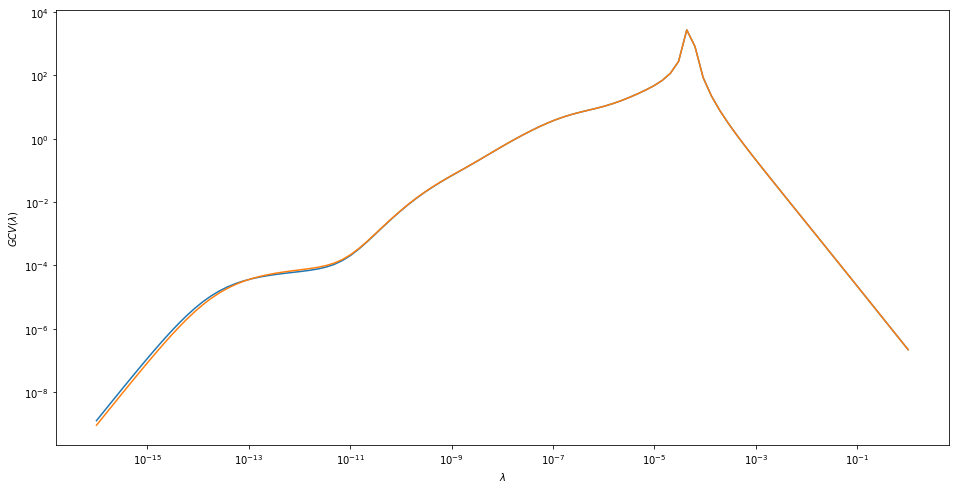

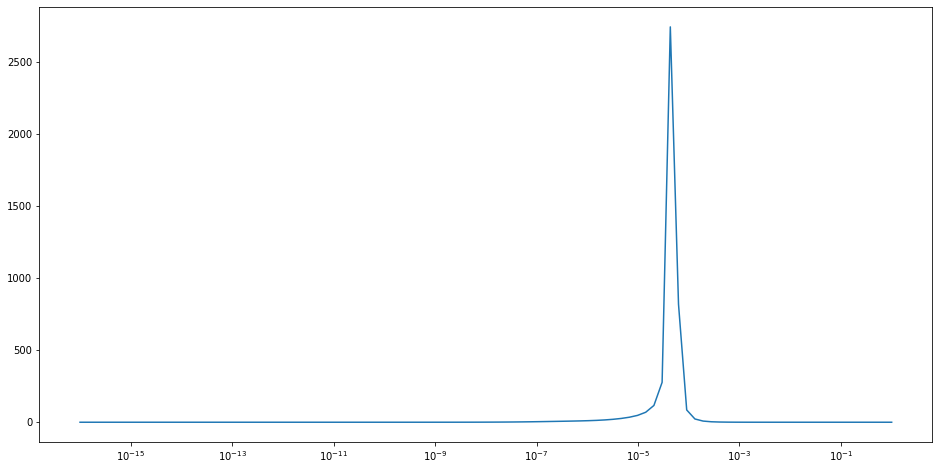

In [2]:
# LOAD DATA

# 1) LOAD DYNAMICS AND TIME ARRAYS

filepath = 'data_files/Lorenz63_dynamics.csv'
dynamics = np.genfromtxt(filepath, delimiter=',')

t = dynamics[0]
data = dynamics[1:]
n_states = int(data.shape[0] / 2)
X = data[0:n_states]
DX = data[n_states:]
t_samples = len(t)

# noise_lvls = [0.001, 0.01, 0.1, 1, 2]
noise_lvls = [0.1]

n_noise_lvls = len(noise_lvls)

mean_dX_error = np.zeros((n_states, n_noise_lvls))
var_dX_error = np.zeros((n_states, n_noise_lvls))  

for noise, sigma in enumerate(noise_lvls):

    # 2) LOAD OBSERVATION SAMPLES
    Y_samples = []
    noise_lvl = str(sigma)

    for state in range(n_states):

        filepath = 'data_files/Lorenz63_samples_noise_' + noise_lvl +'_Y'+ str(state+1) + '.csv'
        y = np.genfromtxt(filepath, delimiter=',')

        Y_samples.append(y)

    n_samples = Y_samples[0].shape[0]

    ################### DENOISING AND NUMERICAL DIFFERENTIATION - SMOOTHING SPLINES ###################
    trim = int(np.floor(5 / 100 * t_samples))
    error_dX = np.zeros((n_samples,n_states))
    tt_samples = t_samples - 2 * trim
    DYhat_tik = np.zeros((n_samples, tt_samples))

    for state in range(n_states):

        for sample in range(n_samples):#n_samples

            y = Y_samples[state][sample,:]
            #Find corner point
            tik = tikhonov_diff.gcv(y, t, lambda_min = 1e-16, lambda_max = 1, plot_lc = True)
            dy_tik = tik[0]
            lambdas, gcv = tik[1]
            plt.figure(figsize = (16,8))
            plt.semilogx(lambdas, gcv)
            #Remove ends
            DYhat_tik[sample,:] = dy_tik[trim:-trim]
            #Compute errors
            error_dX[sample,state] = norm(DYhat_tik[sample,:] - DX[state,trim:-trim]) / norm(DX[state,trim:-trim])
            print('State: ' + str(state+1) + ' | ' + 'Realization: ' + str(sample))
        filename_dy = 'data_files/tikhonov_diff/Lorenz63_tikhonov_diff_gcv_' + noise_lvl + '_dY' + str(state+1) + '.csv'
        with open(filename_dy, 'w') as csvfile:   
            # creating a csv writer object   
            csvwriter = csv.writer(csvfile)   
            # writing the data rows   
            csvwriter.writerows(DYhat_tik)

        mean_dX_error[state, noise] = error_dX[:,state].mean()
        var_dX_error[state, noise] = error_dX[:,state].var()
        
      

In [3]:

temp = [['$\sigma$ = ' + str(x)] * n_states for x in noise_lvls]
noise_indx = np.array([item for sublist in temp for item in sublist])

state_indx = np.array(['state x' + str(x+1) for x in range(n_states)] * n_noise_lvls)

arrays = [noise_indx, state_indx]
data = np.vstack((mean_dX_error.T.flatten(), var_dX_error.T.flatten())).T

col_names = ['mean error dx', 'var. error dx']
df = pd.DataFrame(data, index=arrays, columns=col_names)
df

mean error dx  var. error dx
$\sigma$ = 0.01 state x1       0.020418   1.365034e-06
                state x2       0.013307   5.854597e-07
                state x3       0.010222   3.590594e-07

In [ ]:
#Cheat sheet

#noise = 0.001 -- > lambda_min = 1e-12, lambda_max = 10